In [82]:
from pathlib import Path 

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from PIL import Image
from tqdm.auto import tqdm

In [83]:
df = pd.read_csv('./data/faces.csv', index_col=0)
df.head()

,imdb_id,frame_num,face_num,x1,y1,x2,y2,img_height,img_width,area,pct_of_frame,season,episode,encoding,filename,character,cast_id,cluster
0,1811020,192,0,798,196,916,314,1080,1920,13924,0.007,1,1,"[-0.1581144630908966, 0.11875572055578232, 0.0...",S01E01_192_0.png,NaN,NaN,-1.0
1,1811020,216,0,1068,389,1491,812,1080,1920,178929,0.086,1,1,"[-0.035924218595027924, 0.09460100531578064, 0...",S01E01_216_0.png,NaN,NaN,NaN
2,1811020,216,1,912,17,1205,311,1080,1920,86142,0.042,1,1,"[-0.10312943160533905, 0.1261938065290451, 0.0...",S01E01_216_1.png,NaN,NaN,NaN
3,1811020,240,0,1090,106,1384,400,1080,1920,86436,0.042,1,1,"[-0.18763160705566406, 0.08110883831977844, 0....",S01E01_240_0.png,NaN,NaN,NaN
4,1811020,240,1,674,522,968,816,1080,1920,86436,0.042,1,1,"[-0.11751651763916016, 0.1057925745844841, 0.0...",S01E01_240_1.png,NaN,NaN,NaN


In [5]:
image_dir = Path('./data/images')

## Measuring Distance of Face from the Center of the Image

In [52]:
row = df.iloc[0]
fp = image_dir.joinpath(row['filename'])
h = row['img_height']
w = row['img_width']
x1 = row['x1']
y1 = row['y1']
x2 = row['x2']
y2 = row['y2']
face_x = int(x2 - x1)
face_y = int(y2 - y1)
radius = int(face_x)/2
img_center = (int(w/2), int(h/2))
face_center = (int(x2 - radius), int(y2 - radius))
print(x1, y1, x2, y2)
print(img_center)
print(face_center)

798 196 916 314
(960, 540)
(857, 255)


In [49]:
src = '/home/amos/media/tv/homeland/Homeland.S01.1080p.BluRay.x265-RARBG/Homeland.S01E01.1080p.BluRay.x265-RARBG.mp4'
cap = cv2.VideoCapture(src)
cap.set(cv2.CAP_PROP_POS_FRAMES, row['frame_num'])
ret, frame = cap.read()
img = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

In [64]:
ax = face_center
bx = (face_center[0], img_center[1])
cx = img_center

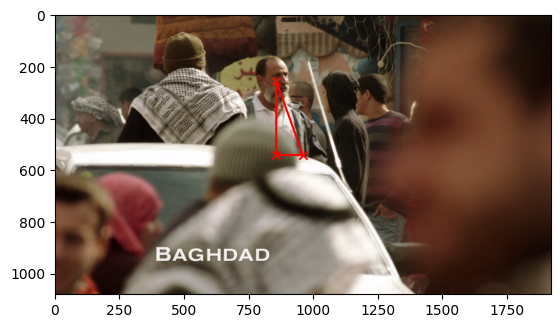

In [62]:
X = [img_center[0], face_center[0], bx[0]]
y = [img_center[1], face_center[1], bx[1]]

plt.xlim([0, w])
plt.ylim([h, 0])
plt.imshow(img)
plt.plot(X, y, marker='x', color='red', markersize=6)

X = [bx[0], img_center[0]]
y = [bx[1], bx[1]]

plt.plot(X, y, marker='x', color='red', markersize=6)

In [68]:
a = bx[1] - ax[1]
b = cx[0] - bx[0]
c = np.sqrt(np.square(a) + np.square(b))
c

303.0412513173743

In [70]:
def calc_distance(row):
    h = row['img_height']
    w = row['img_width']
    x1 = row['x1']
    y1 = row['y1']
    x2 = row['x2']
    y2 = row['y2']
    face_x = int(x2 - x1)
    face_y = int(y2 - y1)
    radius = int(face_x)/2
    img_center = (int(w/2), int(h/2))
    face_center = (int(x2 - radius), int(y2 - radius))
    
    ax = face_center
    bx = (face_center[0], img_center[1])
    cx = img_center

    a = bx[1] - ax[1]
    b = cx[0] - bx[0]
    c = np.sqrt(np.square(a) + np.square(b))
    return int(c)

In [80]:
tqdm().pandas()
df['distance_from_center'] = df.progress_apply(calc_distance, axis=1)
df.head()

0it [00:00, ?it/s]

  0%|          | 0/249536 [00:00<?, ?it/s]

,imdb_id,frame_num,face_num,x1,y1,x2,y2,img_height,img_width,area,pct_of_frame,season,episode,encoding,filename,character,cast_id,cluster,distance_from_center
0,1811020,192,0,798,196,916,314,1080,1920,13924,0.006715,1,1,"[-0.1581144630908966, 0.11875572055578232, 0.0...",S01E01_192_0.png,NaN,NaN,-1.0,303
1,1811020,216,0,1068,389,1491,812,1080,1920,178929,0.086289,1,1,"[-0.035924218595027924, 0.09460100531578064, 0...",S01E01_216_0.png,NaN,NaN,NaN,324
2,1811020,216,1,912,17,1205,311,1080,1920,86142,0.041542,1,1,"[-0.10312943160533905, 0.1261938065290451, 0.0...",S01E01_216_1.png,NaN,NaN,NaN,388
3,1811020,240,0,1090,106,1384,400,1080,1920,86436,0.041684,1,1,"[-0.18763160705566406, 0.08110883831977844, 0....",S01E01_240_0.png,NaN,NaN,NaN,398
4,1811020,240,1,674,522,968,816,1080,1920,86436,0.041684,1,1,"[-0.11751651763916016, 0.1057925745844841, 0.0...",S01E01_240_1.png,NaN,NaN,NaN,189


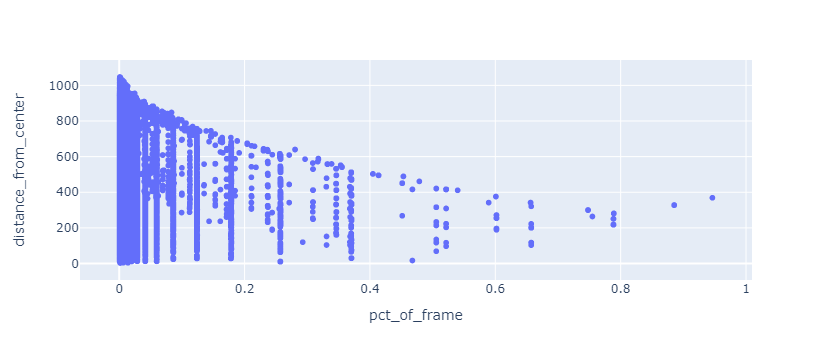

In [81]:
fig = px.scatter(df, y='distance_from_center', x='pct_of_frame')
fig.show()

## Relationship between Frequency and Distance

In [89]:
character_df = df[df['character'].notna()]
character_df['distance_from_center'] = character_df.progress_apply(calc_distance, axis=1)
character_count = character_df['character'].value_counts()
character_df = character_df.merge(character_count,
                                  how='left',
                                  right_index=True,
                                  left_on='character')
character_df.head()

  0%|          | 0/126839 [00:00<?, ?it/s]

/tmp/ipykernel_284663/1812359079.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,imdb_id,frame_num,face_num,x1,y1,x2,y2,img_height,img_width,area,pct_of_frame,season,episode,encoding,filename,character,cast_id,cluster,distance_from_center,count
7,1811020,384,0,497,208,849,560,1080,1920,123904,0.060,1,1,"[-0.09047424793243408, 0.08664017170667648, 0....",S01E01_384_0.png,Carrie Mathison,132.0,NaN,326,33897
8,1811020,408,0,390,208,742,560,1080,1920,123904,0.060,1,1,"[-0.15323874354362488, 0.10863395780324936, 0....",S01E01_408_0.png,Carrie Mathison,132.0,NaN,423,33897
9,1811020,432,0,198,99,807,707,1080,1920,370272,0.179,1,1,"[-0.1460844725370407, 0.09071134030818939, 0.0...",S01E01_432_0.png,Carrie Mathison,132.0,NaN,478,33897
10,1811020,456,0,445,160,1053,769,1080,1920,370272,0.179,1,1,"[-0.11816225200891495, 0.12249065190553665, 0....",S01E01_456_0.png,Carrie Mathison,132.0,NaN,223,33897
11,1811020,480,0,260,160,868,769,1080,1920,370272,0.179,1,1,"[-0.09060899913311005, 0.09976912289857864, 0....",S01E01_480_0.png,Carrie Mathison,132.0,NaN,403,33897


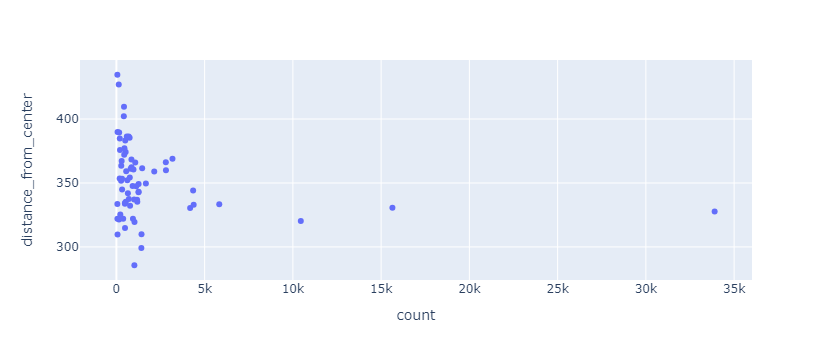

In [93]:
g = character_df.groupby('character').agg({'count': 'max', 'distance_from_center': 'mean'})
fig = px.scatter(g, x='count', y='distance_from_center')
fig.show()